In [77]:
! pip install plotly

     |████████████████████████████████| 21.8 MB 10.6 MB/s eta 0:00:01   |█████▉                          | 4.0 MB 3.6 MB/s eta 0:00:05


In [1]:
import statsmodels as sm
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

sns.set_theme(style="darkgrid")

In [2]:
comp_prices_df = pd.read_csv("../data/comp_prices.csv")
sales_df = pd.read_csv("../data/sales.csv")


In [3]:
comp_prices_df.columns = list(map(str.lower, comp_prices_df.columns))
comp_prices_df["date_extraction"] = pd.to_datetime(comp_prices_df["date_extraction"])
comp_prices_df["date"] = pd.to_datetime(comp_prices_df["date_extraction"].dt.date)
comp_prices_df

,prod_id,date_extraction,competitor,competitor_price,pay_type,date
0,P6,2015-01-30 08:11:38,C3,1898.00,1,2015-01-30
1,P6,2015-01-30 08:11:38,C1,1898.00,1,2015-01-30
2,P6,2015-01-30 08:11:38,C6,1999.90,1,2015-01-30
3,P6,2015-01-31 20:10:14,C2,1894.88,2,2015-01-31
4,P6,2015-01-31 20:10:14,C3,1894.88,2,2015-01-31
...,...,...,...,...,...,...
50109,P5,2015-10-11 20:10:34,C1,819.00,2,2015-10-11
50110,P5,2015-10-11 20:10:34,C2,853.52,2,2015-10-11
50111,P5,2015-10-12 08:11:27,C2,853.52,1,2015-10-12
50112,P5,2015-10-12 08:11:27,C3,819.00,1,2015-10-12


In [4]:
sales_df.columns = list(map(str.lower, sales_df.columns))
sales_df["date_order"] = pd.to_datetime(sales_df.date_order)
sales_df["value_per_item"] = sales_df.revenue/sales_df.qty_order
sales_df

,prod_id,date_order,qty_order,revenue,value_per_item
0,P6,2015-08-02,1.0,1808.99,1808.99
1,P6,2015-08-17,1.0,1674.00,1674.00
2,P6,2015-08-17,1.0,1673.95,1673.95
3,P6,2015-08-11,1.0,1674.00,1674.00
4,P6,2015-08-17,1.0,1674.00,1674.00
...,...,...,...,...,...
351086,P3,2015-09-24,1.0,1008.83,1008.83
351087,P3,2015-10-13,2.0,2333.92,1166.96
351088,P3,2015-09-24,1.0,1311.81,1311.81
351089,P3,2015-10-13,1.0,1166.96,1166.96


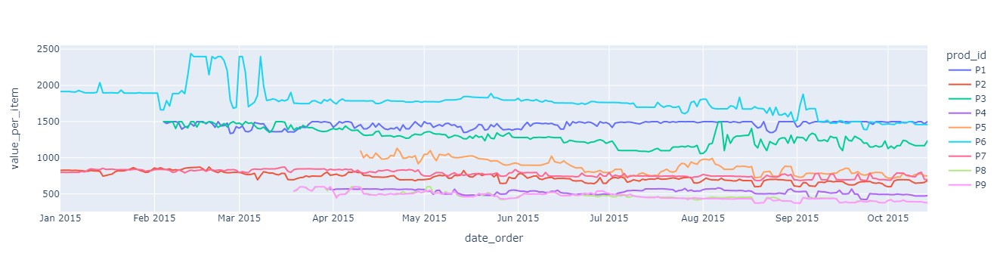

In [5]:
fig = px.line(sales_df.groupby(["prod_id", "date_order"]).agg({"value_per_item" : "mean"}).reset_index(), x="date_order", y="value_per_item", color="prod_id")
fig.show()

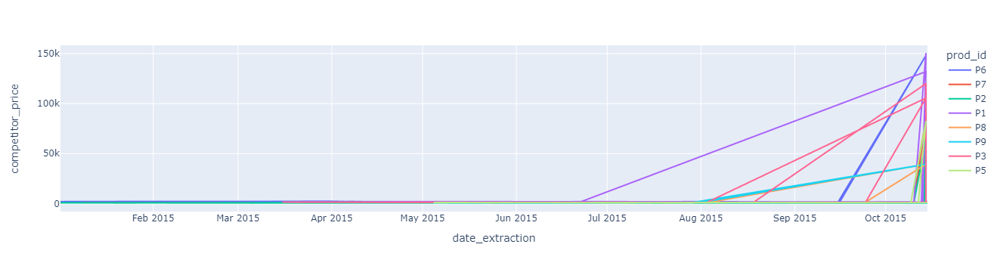

In [6]:
px.line(comp_prices_df[(comp_prices_df.competitor == "C1")], x="date_extraction", y="competitor_price", color="prod_id")

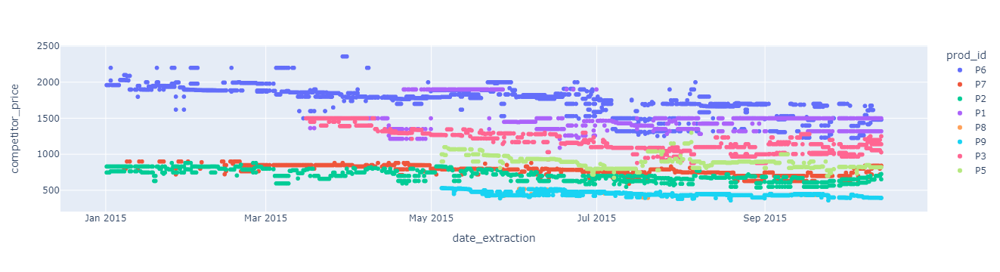

In [7]:
comp_prices_df = comp_prices_df[comp_prices_df.date != pd.to_datetime("2015-10-14")]
px.scatter(comp_prices_df[(comp_prices_df.competitor == "C1")], x="date_extraction", y="competitor_price", color="prod_id")

In [8]:

price_df = pd.concat([    
    comp_prices_df.groupby(["competitor","prod_id","date"])\
        .agg({"competitor_price" : "median"})\
        .reset_index()\
        .rename(columns={"competitor" : "company",
                         "competitor_price" : "price"}),
    sales_df.groupby(["prod_id", "date_order"])
            .agg({"value_per_item" : "median"})\
            .reset_index()\
            .rename(columns={"value_per_item" : "price",
                             "date_order" : "date"})\
            .assign(company="A")
])
price_df["date"] = pd.to_datetime(pd.to_datetime(price_df["date"]))

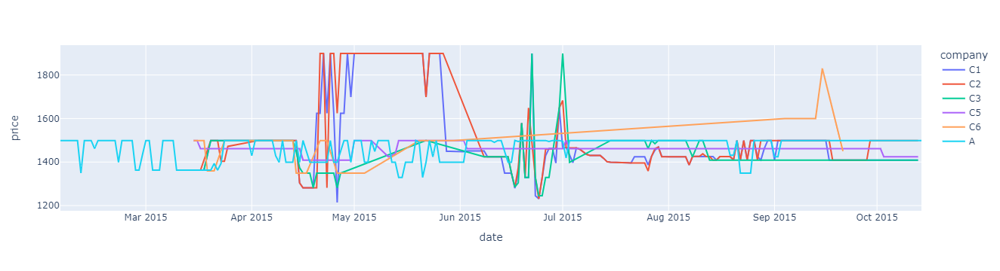

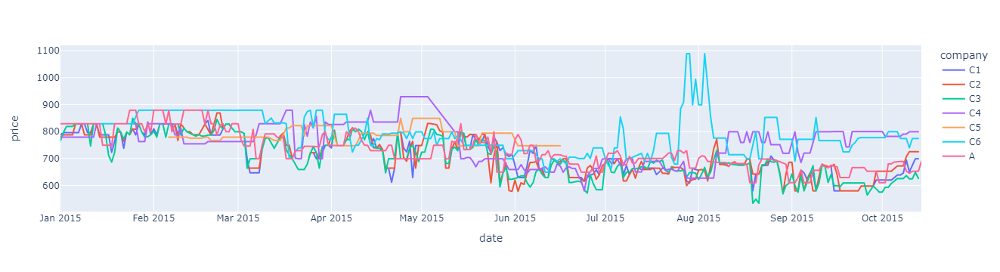

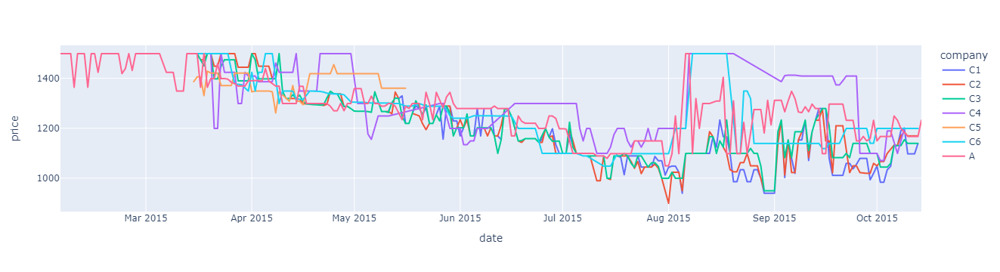

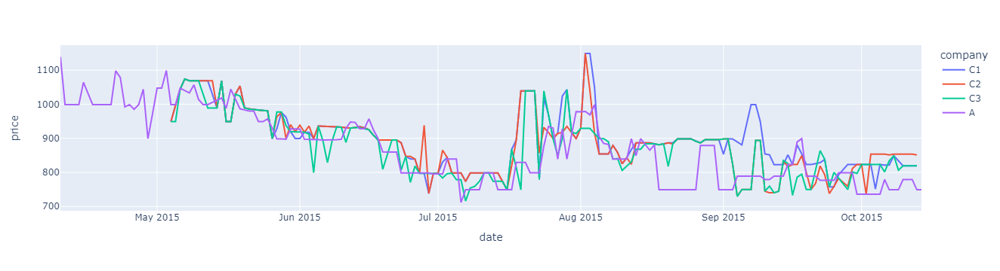

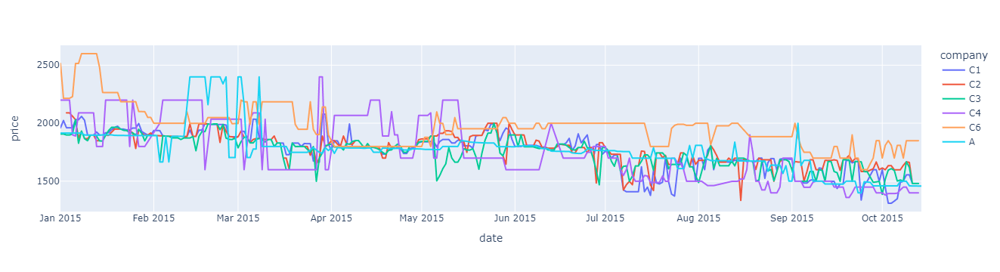

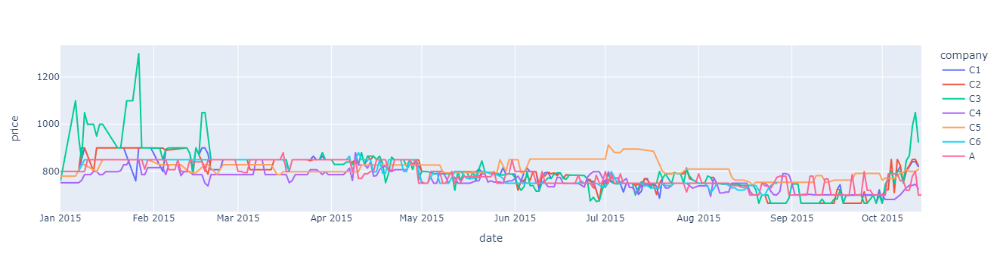

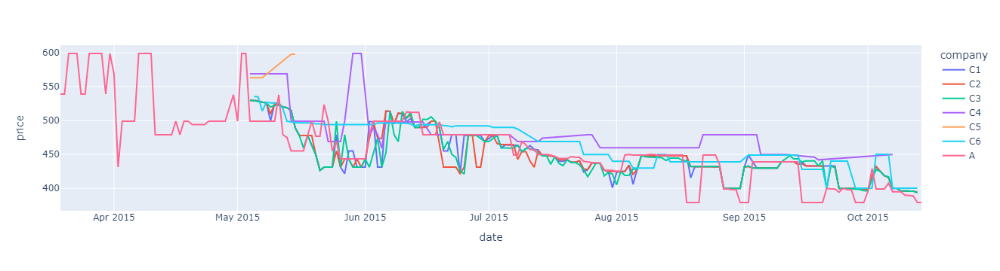

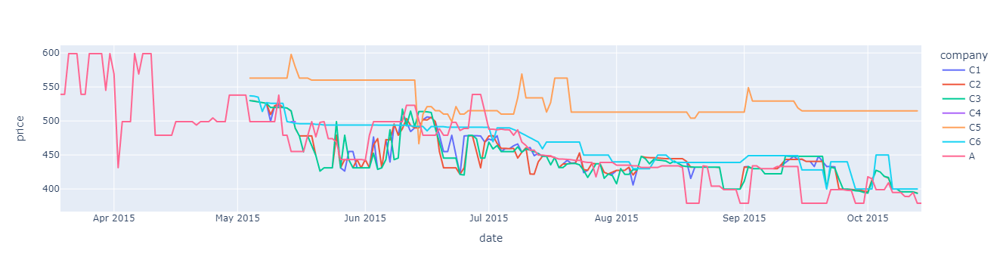

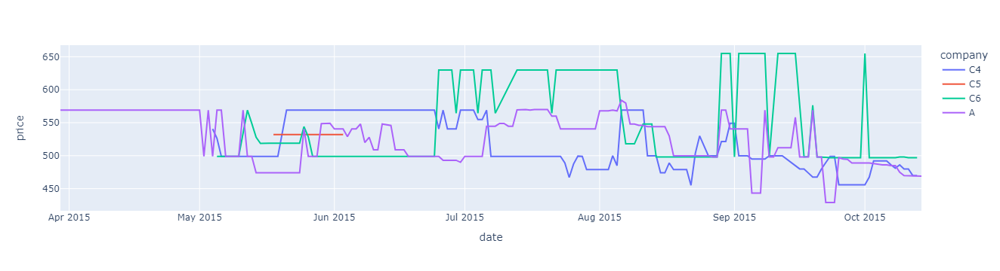

In [9]:
for prod_id in price_df.prod_id.unique():
    fig = px.line(price_df[(price_df.prod_id == prod_id)], x="date", y="price", color='company')
    fig.show()

In [10]:
sales_df

,prod_id,date_order,qty_order,revenue,value_per_item
0,P6,2015-08-02,1.0,1808.99,1808.99
1,P6,2015-08-17,1.0,1674.00,1674.00
2,P6,2015-08-17,1.0,1673.95,1673.95
3,P6,2015-08-11,1.0,1674.00,1674.00
4,P6,2015-08-17,1.0,1674.00,1674.00
...,...,...,...,...,...
351086,P3,2015-09-24,1.0,1008.83,1008.83
351087,P3,2015-10-13,2.0,2333.92,1166.96
351088,P3,2015-09-24,1.0,1311.81,1311.81
351089,P3,2015-10-13,1.0,1166.96,1166.96


In [21]:
df = pd.merge(sales_df.rename(columns={"date_order":"date"})\
             .groupby(["prod_id",
                            "date",
                            "value_per_item"])\
             .agg({"qty_order" : "sum"})\
             .reset_index(),
          comp_prices_df.groupby(["prod_id","date"])\
              .competitor_price.agg(["min","max","mean", "median"])\
              .reset_index(),
         on=["date", "prod_id"]
          )
df

,prod_id,date,value_per_item,qty_order,min,max,mean,median
0,P1,2015-03-15,1294.38,1.0,1499.0,1499.0,1499.0000,1499.0
1,P1,2015-03-15,1347.51,1.0,1499.0,1499.0,1499.0000,1499.0
2,P1,2015-03-15,1362.50,46.0,1499.0,1499.0,1499.0000,1499.0
3,P1,2015-03-16,1362.50,17.0,1362.5,1499.0,1464.2050,1499.0
4,P1,2015-03-16,1499.00,7.0,1362.5,1499.0,1464.2050,1499.0
...,...,...,...,...,...,...,...,...
9164,P9,2015-10-13,360.05,1.0,393.0,569.0,419.4075,394.0
9165,P9,2015-10-13,379.00,257.0,393.0,569.0,419.4075,394.0
9166,P9,2015-10-13,388.63,62.0,393.0,569.0,419.4075,394.0
9167,P9,2015-10-13,394.90,2.0,393.0,569.0,419.4075,394.0


## Pontos a se levar em consideração

- Produtos muito baratos podem ser vendidos em pouca quantidade pois não tem estoque.
- O número de vendas depende do numero de pessoas querendo comprar aquele produto, que pode ser uma função do dia (dia da semana, dia do ano), do histórico


## Possibilidades:

- Agregar preço médio ponderando pelo numero de vendas?

In [22]:
df = pd.merge(df,
         df.groupby(["prod_id", "date"])\
         .agg({"qty_order" : "sum"})\
         .rename(columns={"qty_order" : "qty_day"}),
        on=["prod_id", "date"])

In [23]:
df["diff_min_pct"] = (df.value_per_item - df["min"])/df["min"]
df["diff_mean_pct"] = (df.value_per_item - df["mean"])/df["mean"]

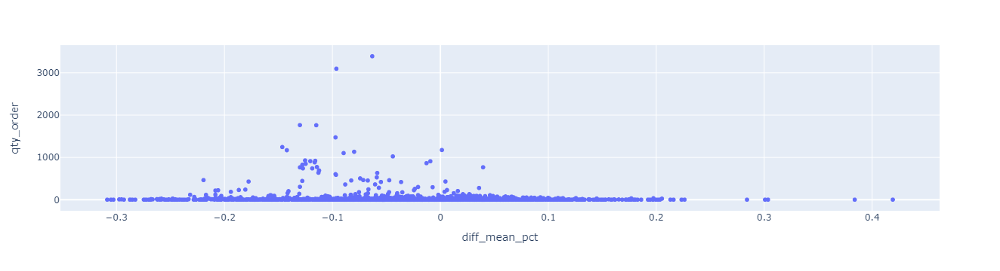

In [24]:
px.scatter(df[(df.prod_id == "P2") & (df.qty_order > 0)], x="diff_mean_pct", y="qty_order")

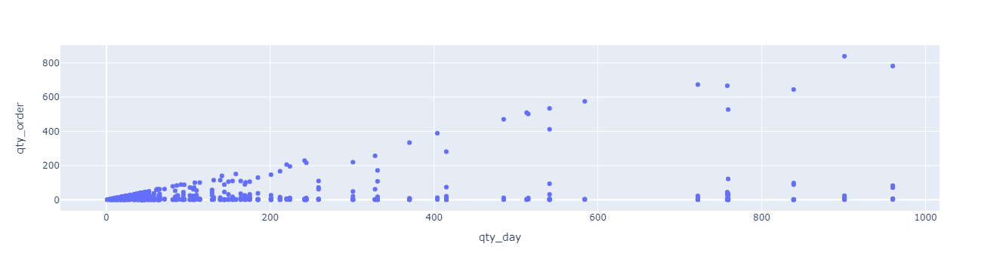

In [25]:
px.scatter(df[(df.prod_id == "P9") & (df.qty_order > 0)], x="qty_day", y="qty_order")

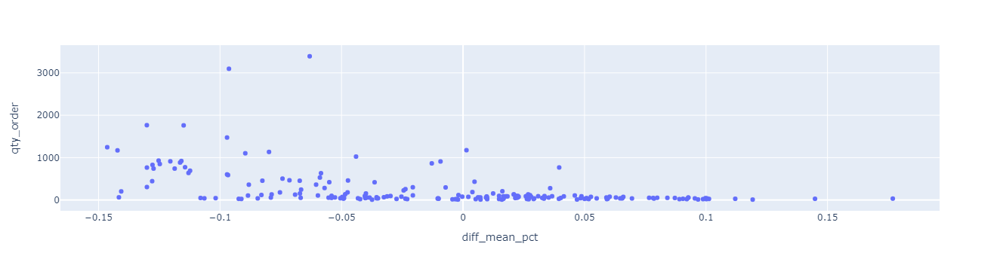

In [26]:
px.scatter(df[(df.prod_id == "P2") & (df.qty_order > 0) & (df.qty_order/df.qty_day > 0.5)], x="diff_mean_pct", y="qty_order")

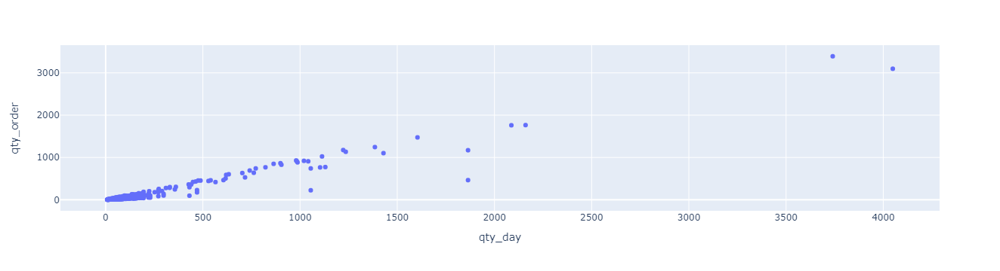

In [27]:
px.scatter(df[(df.prod_id == "P2") & (df.qty_order > 0) & (df.qty_order/df.qty_day > 0.2)], x="qty_day", y="qty_order")

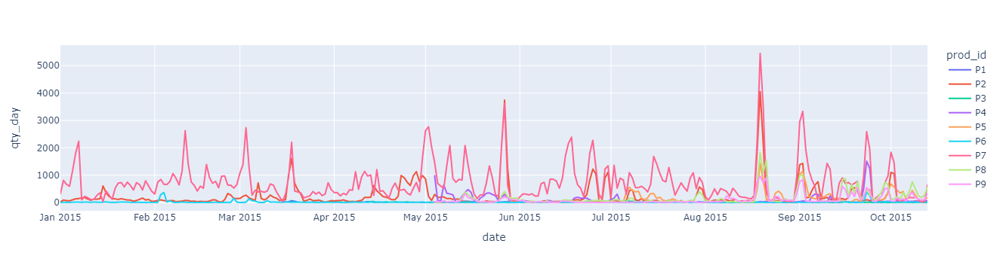

In [29]:
px.line(df.groupby(["prod_id", "date"])\
         .agg({"qty_order" : "sum"})\
         .rename(columns={"qty_order" : "qty_day"})\
         .reset_index(), x="date", y="qty_day", color="prod_id")

In [30]:
df

,prod_id,date,value_per_item,qty_order,min,max,mean,median,qty_day,diff_min_pct,diff_mean_pct
0,P1,2015-03-15,1294.38,1.0,1499.0,1499.0,1499.0000,1499.0,48.0,-0.136504,-0.136504
1,P1,2015-03-15,1347.51,1.0,1499.0,1499.0,1499.0000,1499.0,48.0,-0.101061,-0.101061
2,P1,2015-03-15,1362.50,46.0,1499.0,1499.0,1499.0000,1499.0,48.0,-0.091061,-0.091061
3,P1,2015-03-16,1362.50,17.0,1362.5,1499.0,1464.2050,1499.0,24.0,0.000000,-0.069461
4,P1,2015-03-16,1499.00,7.0,1362.5,1499.0,1464.2050,1499.0,24.0,0.100183,0.023764
...,...,...,...,...,...,...,...,...,...,...,...
9164,P9,2015-10-13,360.05,1.0,393.0,569.0,419.4075,394.0,328.0,-0.083842,-0.141527
9165,P9,2015-10-13,379.00,257.0,393.0,569.0,419.4075,394.0,328.0,-0.035623,-0.096344
9166,P9,2015-10-13,388.63,62.0,393.0,569.0,419.4075,394.0,328.0,-0.011120,-0.073383
9167,P9,2015-10-13,394.90,2.0,393.0,569.0,419.4075,394.0,328.0,0.004835,-0.058434


In [31]:
df

,prod_id,date,value_per_item,qty_order,min,max,mean,median,qty_day,diff_min_pct,diff_mean_pct
0,P1,2015-03-15,1294.38,1.0,1499.0,1499.0,1499.0000,1499.0,48.0,-0.136504,-0.136504
1,P1,2015-03-15,1347.51,1.0,1499.0,1499.0,1499.0000,1499.0,48.0,-0.101061,-0.101061
2,P1,2015-03-15,1362.50,46.0,1499.0,1499.0,1499.0000,1499.0,48.0,-0.091061,-0.091061
3,P1,2015-03-16,1362.50,17.0,1362.5,1499.0,1464.2050,1499.0,24.0,0.000000,-0.069461
4,P1,2015-03-16,1499.00,7.0,1362.5,1499.0,1464.2050,1499.0,24.0,0.100183,0.023764
...,...,...,...,...,...,...,...,...,...,...,...
9164,P9,2015-10-13,360.05,1.0,393.0,569.0,419.4075,394.0,328.0,-0.083842,-0.141527
9165,P9,2015-10-13,379.00,257.0,393.0,569.0,419.4075,394.0,328.0,-0.035623,-0.096344
9166,P9,2015-10-13,388.63,62.0,393.0,569.0,419.4075,394.0,328.0,-0.011120,-0.073383
9167,P9,2015-10-13,394.90,2.0,393.0,569.0,419.4075,394.0,328.0,0.004835,-0.058434


In [34]:
df

,prod_id,date,value_per_item,qty_order,min,max,mean,median,qty_day,diff_min_pct,diff_mean_pct
0,P1,2015-03-15,1294.38,1.0,1499.0,1499.0,1499.0000,1499.0,48.0,-0.136504,-0.136504
1,P1,2015-03-15,1347.51,1.0,1499.0,1499.0,1499.0000,1499.0,48.0,-0.101061,-0.101061
2,P1,2015-03-15,1362.50,46.0,1499.0,1499.0,1499.0000,1499.0,48.0,-0.091061,-0.091061
3,P1,2015-03-16,1362.50,17.0,1362.5,1499.0,1464.2050,1499.0,24.0,0.000000,-0.069461
4,P1,2015-03-16,1499.00,7.0,1362.5,1499.0,1464.2050,1499.0,24.0,0.100183,0.023764
...,...,...,...,...,...,...,...,...,...,...,...
9164,P9,2015-10-13,360.05,1.0,393.0,569.0,419.4075,394.0,328.0,-0.083842,-0.141527
9165,P9,2015-10-13,379.00,257.0,393.0,569.0,419.4075,394.0,328.0,-0.035623,-0.096344
9166,P9,2015-10-13,388.63,62.0,393.0,569.0,419.4075,394.0,328.0,-0.011120,-0.073383
9167,P9,2015-10-13,394.90,2.0,393.0,569.0,419.4075,394.0,328.0,0.004835,-0.058434


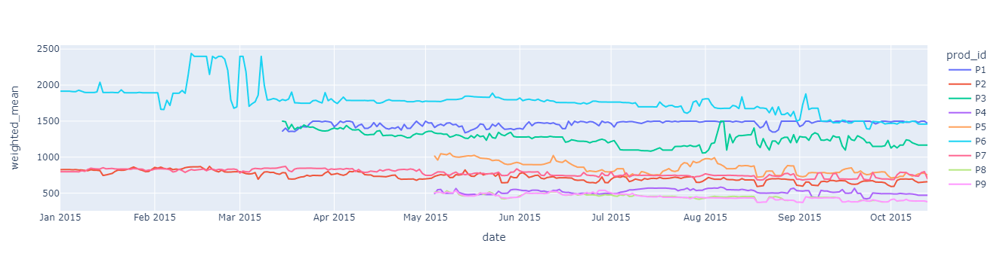

In [35]:
sel_df = df
sel_df["contrib"] = sel_df.value_per_item*sel_df.qty_order/sel_df.qty_day
px.line(sel_df.groupby(["prod_id", "date"])\
         .agg({"contrib" : "sum",
              "min" : "first",
              "mean" : "first"})\
         .rename(columns={"contrib" : "weighted_mean"})\
         .reset_index(), x="date", y="weighted_mean", color="prod_id")

In [36]:
sel_df

,prod_id,date,value_per_item,qty_order,min,max,mean,median,qty_day,diff_min_pct,diff_mean_pct,contrib
0,P1,2015-03-15,1294.38,1.0,1499.0,1499.0,1499.0000,1499.0,48.0,-0.136504,-0.136504,26.966250
1,P1,2015-03-15,1347.51,1.0,1499.0,1499.0,1499.0000,1499.0,48.0,-0.101061,-0.101061,28.073125
2,P1,2015-03-15,1362.50,46.0,1499.0,1499.0,1499.0000,1499.0,48.0,-0.091061,-0.091061,1305.729167
3,P1,2015-03-16,1362.50,17.0,1362.5,1499.0,1464.2050,1499.0,24.0,0.000000,-0.069461,965.104167
4,P1,2015-03-16,1499.00,7.0,1362.5,1499.0,1464.2050,1499.0,24.0,0.100183,0.023764,437.208333
...,...,...,...,...,...,...,...,...,...,...,...,...
9164,P9,2015-10-13,360.05,1.0,393.0,569.0,419.4075,394.0,328.0,-0.083842,-0.141527,1.097713
9165,P9,2015-10-13,379.00,257.0,393.0,569.0,419.4075,394.0,328.0,-0.035623,-0.096344,296.960366
9166,P9,2015-10-13,388.63,62.0,393.0,569.0,419.4075,394.0,328.0,-0.011120,-0.073383,73.460549
9167,P9,2015-10-13,394.90,2.0,393.0,569.0,419.4075,394.0,328.0,0.004835,-0.058434,2.407927


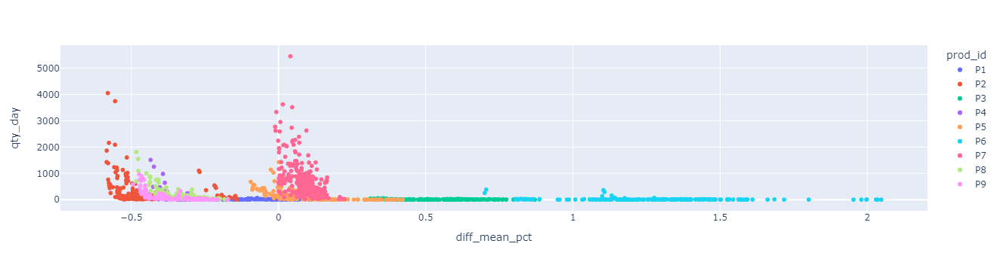

In [37]:
weighted_df = sel_df.groupby(["prod_id", "date", "qty_day"])\
         .agg({"contrib" : "sum",
              "min" : "first",
              "mean" : "first"})\
         .rename(columns={"contrib" : "weighted_mean"})\
         .reset_index()
                 
weighted_df["diff_min_pct"] = (weighted_df.weighted_mean - df["min"])/df["min"]
weighted_df["diff_mean_pct"] = (weighted_df.weighted_mean - df["mean"])/df["mean"]
                 
px.scatter(weighted_df, x="diff_mean_pct", y="qty_day", color="prod_id")

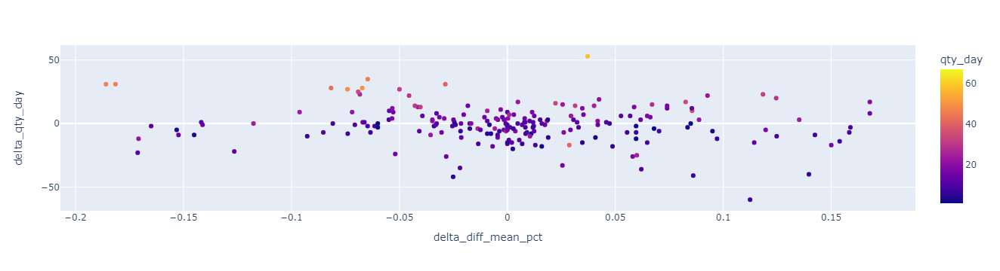

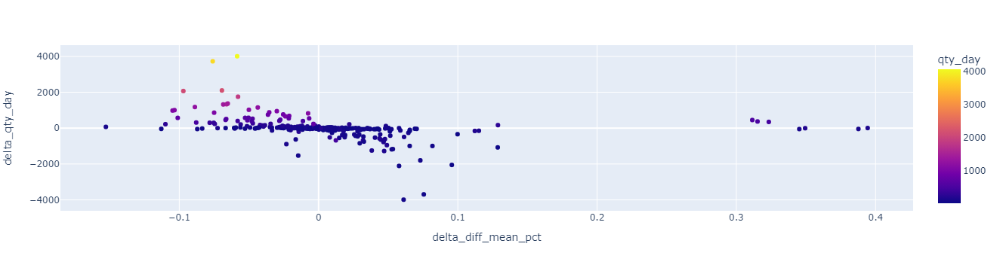

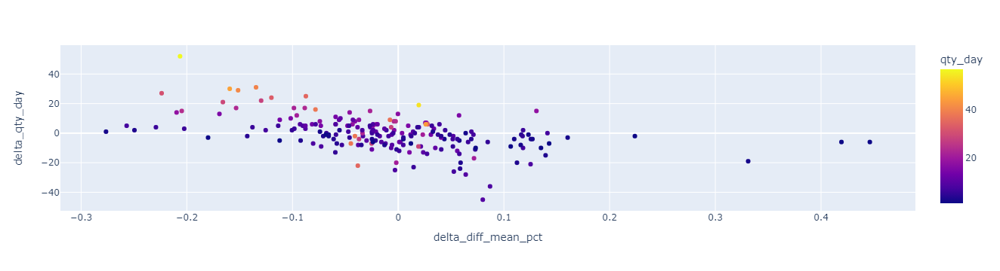

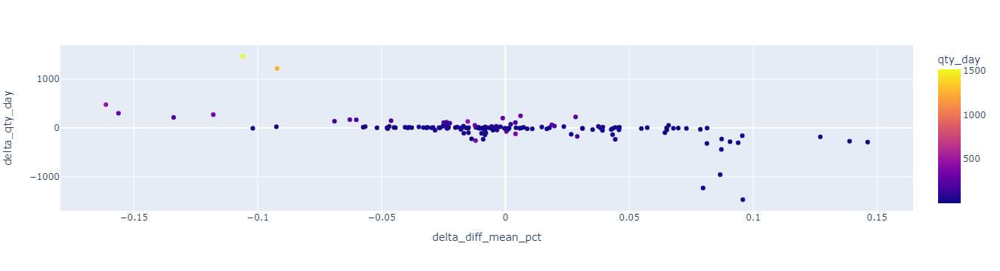

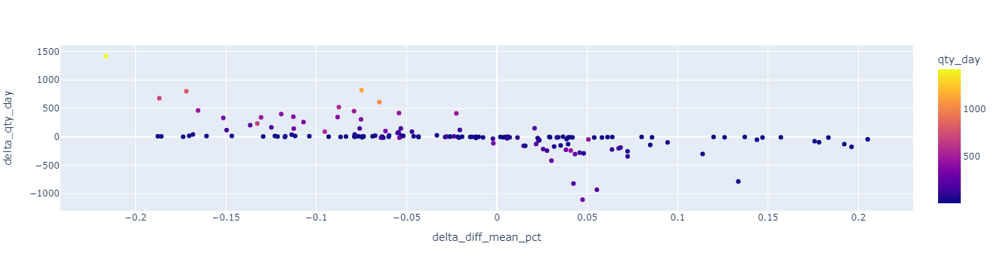

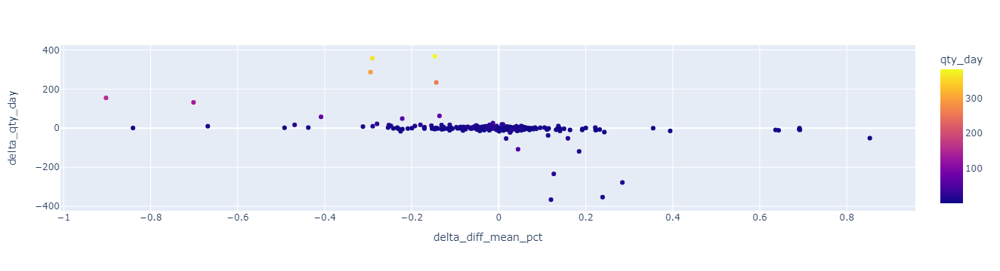

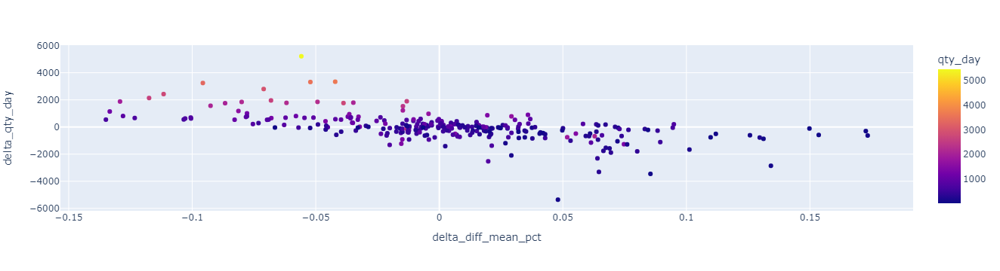

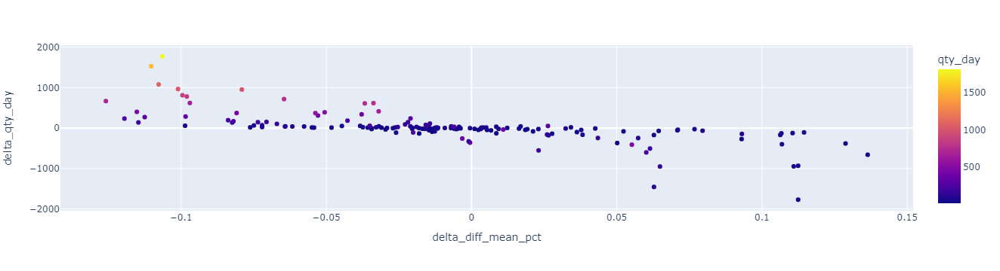

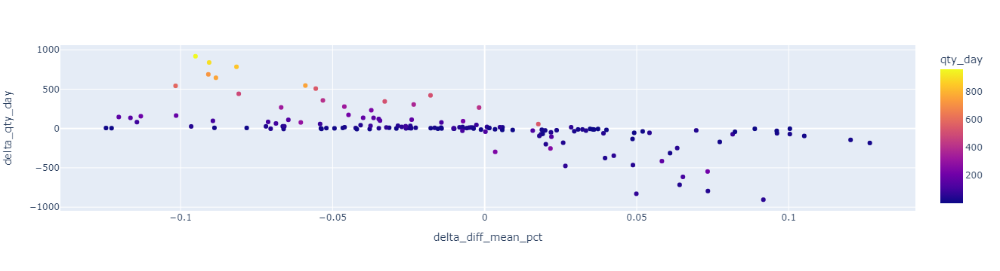

In [38]:
weighted_df["last_qty_day"] = weighted_df.groupby("prod_id").qty_day.shift(7)
weighted_df["last_diff_mean_pct"] = weighted_df.groupby("prod_id").diff_mean_pct.shift(7)
weighted_df["delta_diff_mean_pct"] = weighted_df.diff_mean_pct - weighted_df.last_diff_mean_pct
weighted_df["delta_qty_day"] = weighted_df.qty_day - weighted_df.last_qty_day

for prod_id in weighted_df.prod_id.unique():
    fig = px.scatter(weighted_df[weighted_df.prod_id == prod_id], x="delta_diff_mean_pct", y="delta_qty_day", color="qty_day")
    fig.show()